#EE 292J - Merkle Proofs for Photo Metadata Authenticity

**By Jay Yu**


We can use a Merkle tree, which is a cryptographic primitive that allows for efficient, verifiable commitments to datasets, such as a photo's metadata.

Within this Notebook, we will use a Merkle Tree and the metadata to prove that [this photo](https://drive.google.com/file/d/1-05sSqPV5hix_Drw6dbBYaeMuPIJuB5l/view?usp=sharing) was taken at Stanford. Specifically, we will prove that the Postal Code of the photo's coordinates are equivalent to 94305. We can also prove additional statements, including the Model and Make of the device that took this photo, when it was taken, etc.

We can imagine how this would be useful to journalists who want to prove the photos that they take are genuine.

To run this program, upload IMG_2334.jpeg into the files of this Colab, then run each cell

In [ ]:
!pip install Pillow
!pip install exif
!pip install pymerkle
!pip install geopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.0/70.0 kB 2.7 MB/s eta 0:00:00
  Attempting uninstall: cachetools
    Found existing installation: cachetools 5.5.2
    Uninstalling cachetools-5.5.2:
      Successfully uninstalled cachetools-5.5.2


## Step 1: Extract Image and Metadata

We use Python Image Library (PIL) to read in the image and its metadata using [ExifTags](https://exiftool.org/TagNames/EXIF.html).

{'ApertureValue': 1.6959938128383605,
 'BrightnessValue': 9.948493975903615,
 'ColorSpace': 65535,
 'ComponentsConfiguration': b'\x01\x02\x03\x00',
 'CompositeImage': 2,
 'DateTime': '2021:09:19 14:42:42',
 'DateTimeDigitized': '2021:09:19 14:42:42',
 'DateTimeOriginal': '2021:09:19 14:42:42',
 'ExifImageHeight': 2781,
 'ExifImageWidth': 3708,
 'ExifOffset': 244,
 'ExifVersion': b'0232',
 'ExposureBiasValue': 0.0,
 'ExposureMode': 0,
 'ExposureProgram': 2,
 'ExposureTime': 0.00032,
 'FNumber': 1.8,
 'Flash': 16,
 'FlashPixVersion': b'0100',
 'FocalLength': 4.25,
 'FocalLengthIn35mmFilm': 26,
 'GPSInfo': {1: 'N',
             2: (37.0, 25.0, 43.32),
             3: 'W',
             4: (122.0, 10.0, 7.96),
             5: b'\x00',
             6: 27.483028355915632,
             12: 'K',
             13: 0.0,
             16: 'T',
             17: 144.45100401606425,
             23: 'T',
             24: 144.45100401606425,
             31: 4.988159052724218},
 'HostComputer': 'iPhone 

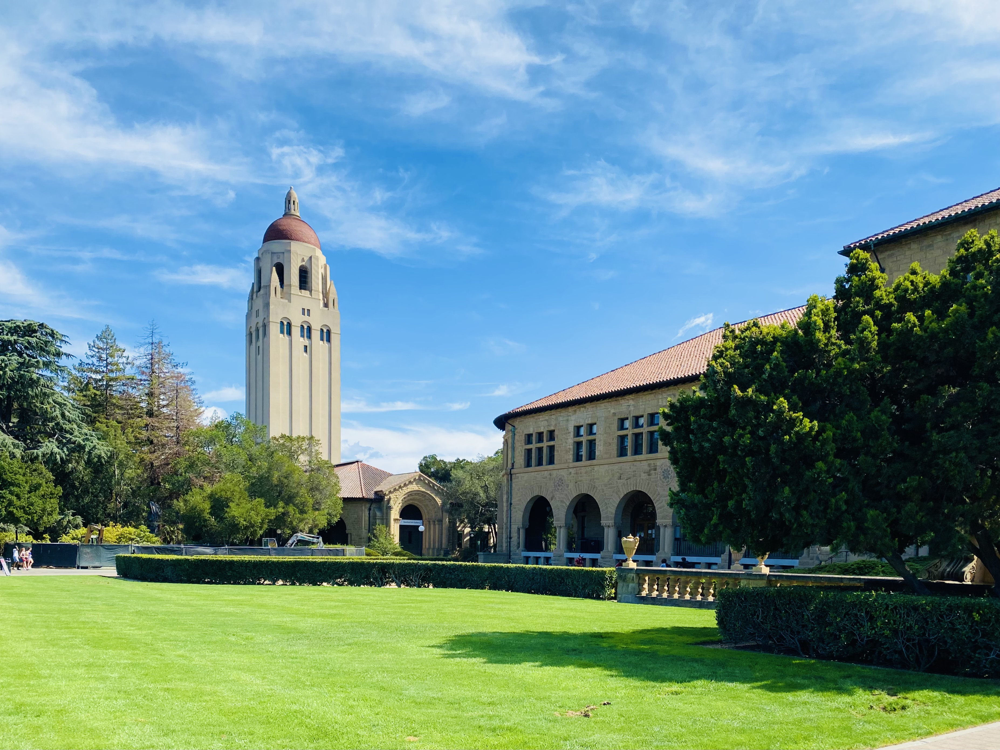

In [ ]:
from pprint import pprint
import os
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS
from IPython.display import display
import hashlib

img_path = "IMG_2334.jpeg"

def get_exif_data(img_path):
    image = Image.open(img_path)
    exif_data = image._getexif()
    metadata = {}
    if exif_data:
        for tag_id, value in exif_data.items():
            tag = TAGS.get(tag_id, tag_id)
            metadata[tag] = value
    return metadata

exif_data = get_exif_data(img_path)
pprint(exif_data)

# Render the image
Image = Image.open(img_path)
display(Image)

## Step 2 (Optional): Get Location Data from Metadata Coordinates

We use Geopy to read in the location coordinates and access the location information stored within. We can then append PostalCode as an extra metadata field.

We can also use this step to do any further data processing.

In [ ]:
from geopy.geocoders import Nominatim

def dms_to_dd(dms, ref):
    degrees, minutes, seconds = dms
    dd = degrees + minutes / 60 + seconds / 3600
    return -dd if ref in ['S', 'W'] else dd

def get_lat_long(gps_info):
    lat = dms_to_dd(gps_info[2], gps_info[1])
    lon = dms_to_dd(gps_info[4], gps_info[3])
    return float(lat), float(lon)

def get_geocode(exif_data):
    lat, lon = get_lat_long(exif_data['GPSInfo'])
    geolocator = Nominatim(user_agent="metadata-reverse-geocoder")
    location = geolocator.reverse((lat, lon), exactly_one=True, language="en")
    if location and location.raw:
        address = location.raw.get("address", {})
        # print(address)
        return {
            "city": address.get("city") or address.get("town") or address.get("hamlet"),
            "street": address.get("road"),
            "postal_code": address.get("postcode"),
            "county": address.get("county"),
            "state": address.get("state")
        }
    return None

print("Get Location from Coordinates in Metadata")
print(get_geocode(exif_data))
# Append postal code to metadata
exif_data["PostalCode"] = get_geocode(exif_data)["postal_code"]

Get Location from Coordinates in Metadata
{'city': 'Stanford', 'street': 'Panama Mall', 'postal_code': '94305', 'county': 'Santa Clara County', 'state': 'California'}


## Step 3: Build Out Merkle Tree

We use `pymerkle` to build an in-memory Merkle tree and print out the Merkle Root. The Merkle Tree does not reveal anything about the original data, but can prove statements about it.

In [ ]:
from pymerkle import InmemoryTree as MerkleTree, verify_inclusion
from pymerkle.hasher import MerkleHasher

tree = MerkleTree(algorithm='sha256')
# Hasher used to independently verify tree.
hasher = MerkleHasher(tree.algorithm, tree.security)

# Map for the index of each entry
key_index_map = {}

# Build Merkle Tree
for key, value in exif_data.items():
    entry_str = f"{key}:{value}"
    # print(entry_str)
    index = tree.append_entry(entry_str.encode())
    key_index_map[key] = index

# Print Merkle Tree
print("Merkle Tree Root: ", tree.get_state().hex())


Merkle Tree Root:  17d17215eb38e78ec085e6190754bed656ffe45fa88da6725fcf8b4ce9a26639


## Step 4: Prove Statements About the Metadata

We can prove certain statements about the metadata from the Merkle tree without revealing all the actual data.

For example, we can prove that the photo was taken at Stanford, was taken by an iPhone 11 Pro Max, and was taken in 2021.

In [ ]:
def prove_statement(tree, key, value):
    # Find tree node index in map

    if key not in key_index_map:
        print(f"Error: Key {key} not found")
        return False
    index = key_index_map[key]
    target_value = value
    # Hash key value into leaf format
    leaf = hasher.hash_buff(f"{key}:{value}".encode())

    root = tree.get_state(tree.get_size())
    proof = tree.prove_inclusion(index, tree.get_size(), )
    print(f"Leaf: {leaf.hex()}")
    print(f"Root: {root.hex()}")
    # Print Proof Path
    print("Proof: ",[sibling.hex() for sibling in proof.path])
    try:
        verify_inclusion(leaf, root, proof)
        return True
    except:
        return False

# Prove the following properties about the data
targets = [("PostalCode", "94305"), # Prove taken at Stanford
           ("DateTime", "2021:09:19 14:42:42"), # Prove taken time
           ("Model", "iPhone 11 Pro Max"), # Prove taken device
           ("PostalCode", "94102"), # False Postal Code (for San Francisco)
           ('FakeData', 'FakeValue')] # Entry does not exist

for target in targets:
    print(f"Proving Statement: {target}")
    print("Result:", prove_statement(tree, target[0], target[1]))
    print("---------")

Proving Statement: ('PostalCode', '94305')
Leaf: 2e2b8d5d37776b13d3020099408cb9a77f580f86760e376c8981c55203e9771c
Root: 17d17215eb38e78ec085e6190754bed656ffe45fa88da6725fcf8b4ce9a26639
Proof:  ['2e2b8d5d37776b13d3020099408cb9a77f580f86760e376c8981c55203e9771c', '6410817c4b533ee7650108e907e5aaf543612a307c9f09f8e4a4cc9aa385fd16', '5e10ca88d8033df1e62b7b66d48b5f11e9e81ee54e2c7f9bbbab252418ec07e8']
Result: True
---------
Proving Statement: ('DateTime', '2021:09:19 14:42:42')
Leaf: b3d35603e38bdc9a18dcb1f2a573ebe6f51e06f47ac546e55c7caa885d1b0690
Root: 17d17215eb38e78ec085e6190754bed656ffe45fa88da6725fcf8b4ce9a26639
Proof:  ['b3d35603e38bdc9a18dcb1f2a573ebe6f51e06f47ac546e55c7caa885d1b0690', '7a1f55c43de1eed7e6fe472361a36d87cbced07881ca19c3f5aa0ac0e02dd4de', '1292c47d0550f878c8d9a9d82853693e33b00175440a98e07a6bfb9c0d9897fe', '1fa7aa1a9f93e3ff137b8fb9351baf840c3bb25ad3110d73bf2f23f9e137df0b', 'f3169d443289df617b536aa81bebfba15bace78d1355d683e612b4d663a29159', '71faa207bd41d4f3c38989cb146c3560